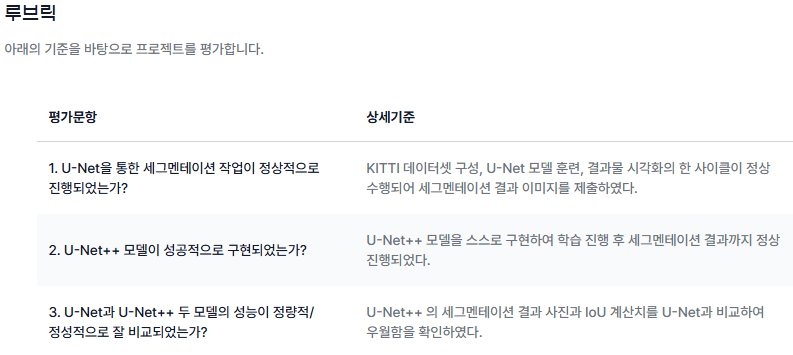

## 루브릭 1. U-Net을 통한 세그멘테이션 작업 진행

In [1]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
  if is_train:    # 훈련용 데이터일 경우
    return Compose([
                    HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                    RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=224,
                        width=224,
                        p=0.5
                        ),
                    Resize(              # 입력이미지를 224X224로 resize
                        width=224,
                        height=224
                        )
                    ])
  return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                Resize(
                    width=224,
                    height=224
                    )
                ])

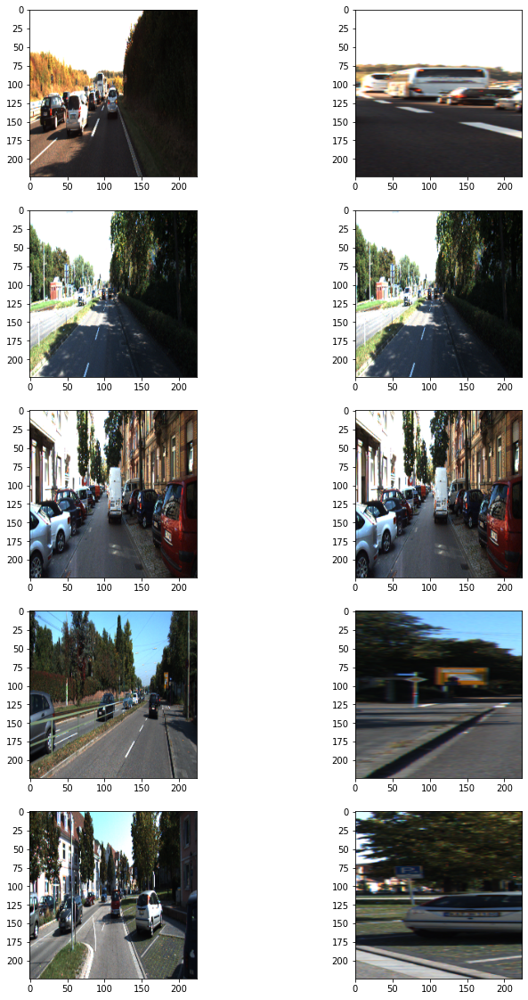

In [4]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

In [5]:
class KittiGenerator(tf.keras.utils.Sequence):
  '''
  KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
  우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
  '''
  def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
    '''
    dir_path: dataset의 directory path입니다.
    batch_size: batch_size입니다.
    img_size: preprocess에 사용할 입력이미지의 크기입니다.
    output_size: ground_truth를 만들어주기 위한 크기입니다.
    is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
    augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
    '''
    self.dir_path = dir_path
    self.batch_size = batch_size
    self.is_train = is_train
    self.dir_path = dir_path
    self.augmentation = augmentation
    self.img_size = img_size
    self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
    self.data = self.load_dataset()

  def load_dataset(self):
    # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
    # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
    input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
    label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
    input_images.sort()
    label_images.sort()
    assert len(input_images) == len(label_images)
    data = [ _ for _ in zip(input_images, label_images)]

    if self.is_train:
      return data[:-30]
    return data[-30:]
    
  def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
    return math.ceil(len(self.data) / self.batch_size)

  def __getitem__(self, index):
    # 입력과 출력을 만듭니다.
    # 입력은 resize및 augmentation이 적용된 input image이고 
    # 출력은 semantic label입니다.
    batch_data = self.data[
                           index*self.batch_size:
                           (index + 1)*self.batch_size
                           ]
    inputs = np.zeros([self.batch_size, *self.img_size])
    outputs = np.zeros([self.batch_size, *self.output_size])
        
    for i, data in enumerate(batch_data):
      input_img_path, output_path = data
      _input = imread(input_img_path)
      _output = imread(output_path)
      _output = (_output==7).astype(np.uint8)*1
      data = {
          "image": _input,
          "mask": _output,
          }
      augmented = self.augmentation(**data)
      inputs[i] = augmented["image"]/255
      outputs[i] = augmented["mask"]
      return inputs, outputs

  def on_epoch_end(self):
    # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
    self.indexes = np.arange(len(self.data))
    if self.is_train == True :
      np.random.shuffle(self.indexes)
      return self.indexes

In [6]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

In [7]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Dropout, concatenate
from tensorflow.keras.models import Model

def build_model(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)
    
    # Contracting Path
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(0.5)(p4)

    # Bottleneck
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)
    c5 = Dropout(0.5)(c5)

    # Expanding Path
    u6 = UpSampling2D((2, 2))(c5)
    u6 = Conv2D(512, (2, 2), activation='relu', padding='same')(u6)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = Conv2D(256, (2, 2), activation='relu', padding='same')(u7)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = Conv2D(128, (2, 2), activation='relu', padding='same')(u8)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = Conv2D(64, (2, 2), activation='relu', padding='same')(u9)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    # Output layer with two Conv2D layers as shown in the summary
    outputs = Conv2D(2, (1, 1), activation='relu', padding='same')(c9)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(outputs)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [8]:
model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_GD.h5'

model = build_model()
model.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')
model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=100,
 )

model.save(model_path)  #학습한 모델을 저장해 주세요.

Epoch 1/100
11/11 [==============================] - 28s 791ms/step - loss: 0.6829 - val_loss: 0.6424
Epoch 2/100
11/11 [==============================] - 8s 770ms/step - loss: 0.3206 - val_loss: 0.0466
Epoch 3/100
11/11 [==============================] - 8s 755ms/step - loss: 0.0354 - val_loss: 0.0362
Epoch 4/100
11/11 [==============================] - 8s 750ms/step - loss: 0.0285 - val_loss: 0.0321
Epoch 5/100
11/11 [==============================] - 8s 755ms/step - loss: 0.0329 - val_loss: 0.0343
Epoch 6/100
11/11 [==============================] - 8s 758ms/step - loss: 0.0332 - val_loss: 0.0354
Epoch 7/100
11/11 [==============================] - 8s 760ms/step - loss: 0.0314 - val_loss: 0.0543
Epoch 8/100
11/11 [==============================] - 8s 756ms/step - loss: 0.0441 - val_loss: 0.0297
Epoch 9/100
11/11 [==============================] - 8s 758ms/step - loss: 0.0292 - val_loss: 0.0363
Epoch 10/100
11/11 [==============================] - 8s 752ms/step - loss: 0.0293 - val_l

In [9]:
# 미리 준비한 모델을 불러오려면 아래 주석을 해제하세요
# model_path = dir_path + '/seg_model_unet.h5' 

model = tf.keras.models.load_model(model_path)

In [10]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [11]:
def get_output(model, preproc, image_path, output_path):
     origin_img = imread(image_path)
     data = {"image":origin_img}
     processed = preproc(**data)
     output = model(np.expand_dims(processed["image"]/255,axis=0))
     output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
     output = Image.fromarray(output)
     background = Image.fromarray(origin_img).convert('RGBA')
     output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
     output = Image.blend(background, output, alpha=0.5)
     output.show()
     return output

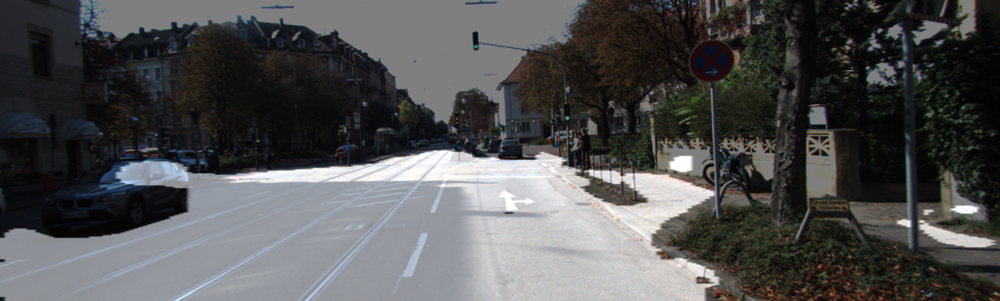

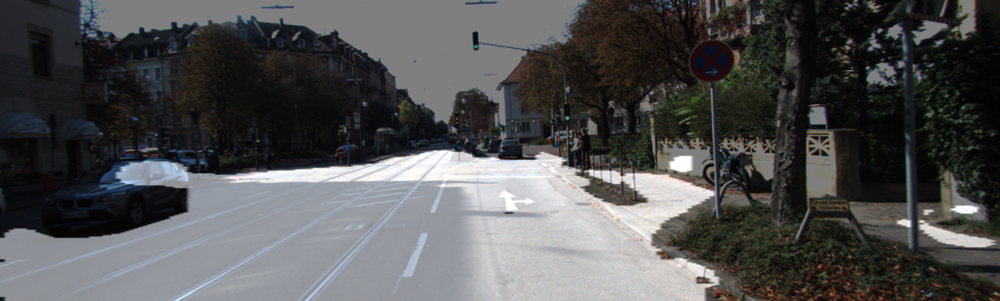

In [12]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

In [13]:
def calculate_iou_score(target, prediction):
    # 교차 영역 (Intersection): target과 prediction이 모두 True인 부분만 True로 남깁니다.
    intersection = np.logical_and(target, prediction).sum()
    
    # 합집합 영역 (Union): target이나 prediction 중 하나라도 True인 부분을 계산합니다.
    union = np.logical_or(target, prediction).sum()
    
    # IoU 계산
    iou_score = float(intersection) / float(union) if union != 0 else 0.0
    
    print('IoU : %f' % iou_score)
    return iou_score

In [14]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

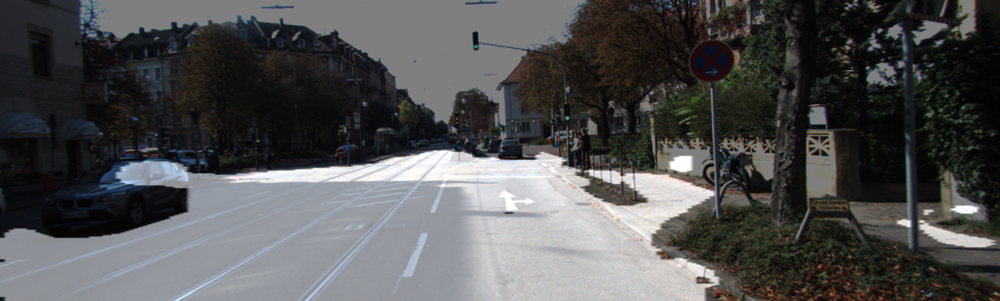

IoU : 0.857614


0.8576135726303982

In [15]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

## 루브릭 2. U-Net ++ 구현

In [18]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Dropout
from tensorflow.keras.layers import BatchNormalization, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
import tensorflow.keras.backend as K

# Activation function과 dropout rate 설정
act = 'relu'
dropout_rate = 0.5

def standard_unit(input_tensor, stage, nb_filter, kernel_size=3):
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation=act, name='conv' + stage + '_1', 
               kernel_initializer='he_normal', padding='same', kernel_regularizer=l2(1e-4))(input_tensor)
    x = Dropout(dropout_rate, name='dp' + stage + '_1')(x)
    
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation=act, name='conv' + stage + '_2', 
               kernel_initializer='he_normal', padding='same', kernel_regularizer=l2(1e-4))(x)
    x = Dropout(dropout_rate, name='dp' + stage + '_2')(x)

    return x

def UNetPlusPlus(img_rows, img_cols, color_type=1, num_class=1, deep_supervision=False):
    nb_filter = [32, 64, 128, 256, 512]
    global bn_axis
    bn_axis = 3  # for 'channels_last' format

    img_input = Input(shape=(img_rows, img_cols, color_type), name='main_input')

    conv1_1 = standard_unit(img_input, stage='11', nb_filter=nb_filter[0])
    pool1 = MaxPooling2D((2, 2), strides=(2, 2), name='pool1')(conv1_1)

    conv2_1 = standard_unit(pool1, stage='21', nb_filter=nb_filter[1])
    pool2 = MaxPooling2D((2, 2), strides=(2, 2), name='pool2')(conv2_1)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(conv2_1)
    conv1_2 = concatenate([up1_2, conv1_1], name='merge12', axis=bn_axis)
    conv1_2 = standard_unit(conv1_2, stage='12', nb_filter=nb_filter[0])

    conv3_1 = standard_unit(pool2, stage='31', nb_filter=nb_filter[2])
    pool3 = MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = concatenate([up2_2, conv2_1], name='merge22', axis=bn_axis)
    conv2_2 = standard_unit(conv2_2, stage='22', nb_filter=nb_filter[1])

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = concatenate([up1_3, conv1_1, conv1_2], name='merge13', axis=bn_axis)
    conv1_3 = standard_unit(conv1_3, stage='13', nb_filter=nb_filter[0])

    conv4_1 = standard_unit(pool3, stage='41', nb_filter=nb_filter[3])
    pool4 = MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=bn_axis)
    conv3_2 = standard_unit(conv3_2, stage='32', nb_filter=nb_filter[2])

    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = concatenate([up2_3, conv2_1, conv2_2], name='merge23', axis=bn_axis)
    conv2_3 = standard_unit(conv2_3, stage='23', nb_filter=nb_filter[1])

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = concatenate([up1_4, conv1_1, conv1_2, conv1_3], name='merge14', axis=bn_axis)
    conv1_4 = standard_unit(conv1_4, stage='14', nb_filter=nb_filter[0])

    conv5_1 = standard_unit(pool4, stage='51', nb_filter=nb_filter[4])

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=bn_axis)
    conv4_2 = standard_unit(conv4_2, stage='42', nb_filter=nb_filter[3])

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=bn_axis)
    conv3_3 = standard_unit(conv3_3, stage='33', nb_filter=nb_filter[2])

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, conv2_1, conv2_2, conv2_3], name='merge24', axis=bn_axis)
    conv2_4 = standard_unit(conv2_4, stage='24', nb_filter=nb_filter[1])

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, conv1_1, conv1_2, conv1_3, conv1_4], name='merge15', axis=bn_axis)
    conv1_5 = standard_unit(conv1_5, stage='15', nb_filter=nb_filter[0])

    nestnet_output_1 = Conv2D(num_class, (1, 1), activation='sigmoid', name='output_1', kernel_initializer='he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_2)
    nestnet_output_2 = Conv2D(num_class, (1, 1), activation='sigmoid', name='output_2', kernel_initializer='he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_3)
    nestnet_output_3 = Conv2D(num_class, (1, 1), activation='sigmoid', name='output_3', kernel_initializer='he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_4)
    nestnet_output_4 = Conv2D(num_class, (1, 1), activation='sigmoid', name='output_4', kernel_initializer='he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_5)

    if deep_supervision:
        model = Model(inputs=[img_input], outputs=[nestnet_output_1, nestnet_output_2, nestnet_output_3, nestnet_output_4])
    else:
        model = Model(inputs=[img_input], outputs=[nestnet_output_4])

    return model


In [21]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K

# Dice coefficient and Dice coefficient loss
def dice_coef(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

# 모델 저장 경로 설정
model_path = os.getenv('HOME') + '/aiffel/semantic_segmentation/seg_model_unetplusplus.h5'

# 모델 정의
model = UNetPlusPlus(img_rows=224, img_cols=224, color_type=3, num_class=1, deep_supervision=False)
model.compile(optimizer=Adam(learning_rate=1e-4), loss=dice_coef_loss, metrics=[dice_coef])

# ModelCheckpoint 콜백 설정 (val_loss가 가장 낮을 때 저장)
checkpoint = ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# 모델 학습
model.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=100,
    callbacks=[checkpoint]
)

Epoch 1/100
11/11 [==============================] - 22s 723ms/step - loss: 1.6749 - dice_coef: 0.0495 - val_loss: 1.6643 - val_dice_coef: 0.0525

Epoch 00001: val_loss improved from inf to 1.66427, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unetplusplus.h5
Epoch 2/100
11/11 [==============================] - 7s 666ms/step - loss: 1.6634 - dice_coef: 0.0465 - val_loss: 1.6405 - val_dice_coef: 0.0609

Epoch 00002: val_loss improved from 1.66427 to 1.64053, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unetplusplus.h5
Epoch 3/100
11/11 [==============================] - 7s 670ms/step - loss: 1.6452 - dice_coef: 0.0488 - val_loss: 1.6201 - val_dice_coef: 0.0648

Epoch 00003: val_loss improved from 1.64053 to 1.62013, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unetplusplus.h5
Epoch 4/100
11/11 [==============================] - 7s 674ms/step - loss: 1.6197 - dice_coef: 0.0574 - val_loss: 1.6013 - val_dice_coef: 0.0664

Epoch 00004: v

In [24]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
main_input (InputLayer)         [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv11_1 (Conv2D)               (None, 224, 224, 32) 896         main_input[0][0]                 
__________________________________________________________________________________________________
dp11_1 (Dropout)                (None, 224, 224, 32) 0           conv11_1[0][0]                   
__________________________________________________________________________________________________
conv11_2 (Conv2D)               (None, 224, 224, 32) 9248        dp11_1[0][0]                     
____________________________________________________________________________________________

In [26]:
def get_output(model, preproc, image_path, output_path):
     origin_img = imread(image_path)
     data = {"image":origin_img}
     processed = preproc(**data)
     output = model(np.expand_dims(processed["image"]/255,axis=0))
     output = (output[0].numpy()>0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
     output = Image.fromarray(output)
     background = Image.fromarray(origin_img).convert('RGBA')
     output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
     output = Image.blend(background, output, alpha=0.5)
     output.show()
     return output

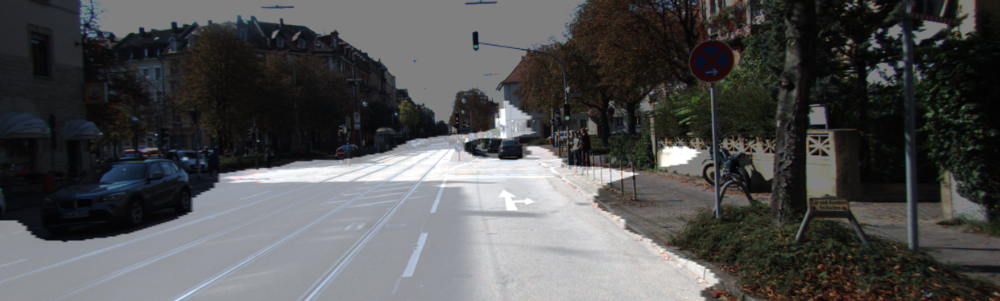

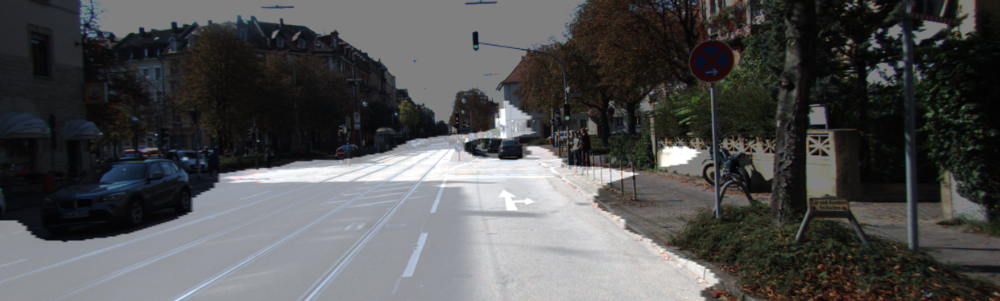

In [27]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

In [28]:
def calculate_iou_score(target, prediction):
    # 교차 영역 (Intersection): target과 prediction이 모두 True인 부분만 True로 남깁니다.
    intersection = np.logical_and(target, prediction).sum()
    
    # 합집합 영역 (Union): target이나 prediction 중 하나라도 True인 부분을 계산합니다.
    union = np.logical_or(target, prediction).sum()
    
    # IoU 계산
    iou_score = float(intersection) / float(union) if union != 0 else 0.0
    
    print('IoU : %f' % iou_score)
    return iou_score

In [30]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

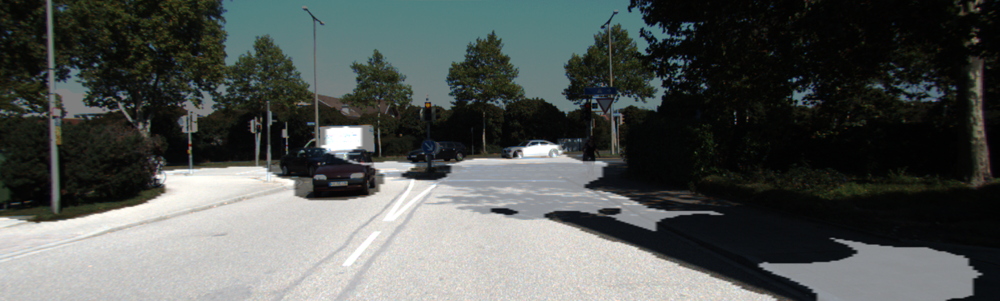

IoU : 0.707157


0.7071572580645161

In [32]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 7    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

## 루브릭 3. UNet과 UNet++ 성능비교!

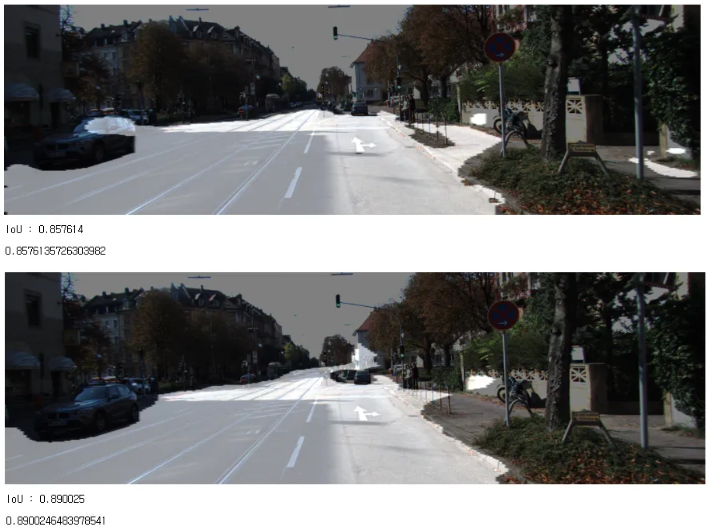

위: UNet
아래: UNet++

## 회고

* ### 오늘은 UNet과 UNet++ 를 구현하고, 구현된 모델을 기반으로 차도를 segmentation하는 모델을 학습시켰다.
* ### UNet++ 가 아주 근소한 차이로 좋게나왔다.
* ### 아직 코드의 분석이 완벽하지 않아서 정확한 결과로 보기 어려울 수 있지만, 그래도 결과까지 나왔다는 것에 만족한다.
* ### 확실히 UNet ++는 최적지점까지 학습되지 않은 것 같아서 더 많은 에폭을 돌려야할 것 같다.

## 도로를 class로 잡고 학습 (feed back)

* focal loss 사용해보기
* 물체를 class 추가 (배경 구분)
* metric 추가하여 관찰

---
# 2일차!

## 실험 진행!
### UNet과 UNet++ 성능 향상을 위해 실험들을 진행함.
### 데이터 증강에서 대비 조절과 밝기, 색상 변화를 넣어서 그림자로 인한 오인을 줄여보고자 함.

In [1]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.utils import to_categorical

In [2]:
from albumentations import HorizontalFlip, RandomSizedCrop, Compose, Resize, RandomBrightnessContrast, HueSaturationValue

def build_augmentation(is_train=True):
    if is_train:  # 훈련용 데이터일 경우
        return Compose([
            HorizontalFlip(p=0.5),  # 50%의 확률로 좌우대칭
            RandomSizedCrop(  # 50%의 확률로 RandomSizedCrop
                min_max_height=(300, 370),
                w2h_ratio=370 / 1242,
                height=224,
                width=224,
                p=0.5
            ),
            RandomBrightnessContrast(  # 밝기와 대비를 랜덤하게 조절
                brightness_limit=0.2,  # 밝기를 -20%에서 +20% 사이로 조절
                contrast_limit=0.2,  # 대비를 -20%에서 +20% 사이로 조절
                p=0.5
            ),
            HueSaturationValue(  # 색상, 채도 및 명도를 랜덤하게 조절
                hue_shift_limit=10,  # 색상 변화를 ±10 정도로 조절
                sat_shift_limit=10,  # 채도를 ±10 정도로 조절
                val_shift_limit=10,  # 명도를 ±10 정도로 조절
                p=0.5
            ),
            Resize(  # 입력 이미지를 224X224로 resize
                width=224,
                height=224
            )
        ])
    return Compose([  # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다.
        Resize(
            width=224,
            height=224
        )
    ])

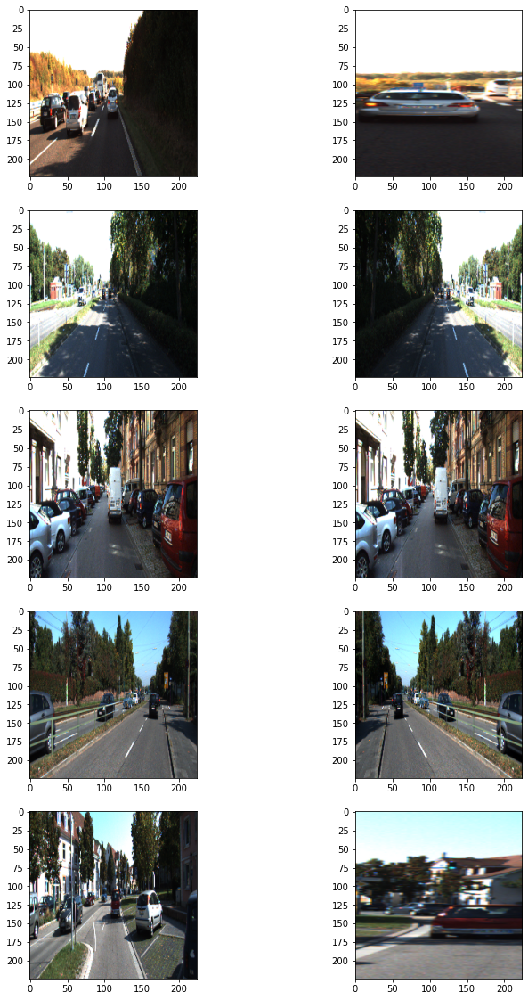

In [3]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
    
plt.show()

In [4]:
class KittiGenerator(tf.keras.utils.Sequence):
    def __init__(self, 
                 dir_path,
                 batch_size=16,
                 img_size=(224, 224, 3),
                 output_size=(224, 224),
                 is_train=True,
                 augmentation=None):
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

        # 데이터셋 로드
        self.data = self.load_dataset()

        # 레이블 매핑 테이블 설정
        self.label_mapping = {
            0: 7, 1: 8, 2: 11, 3: 12, 4: 13, 5: 17, 6: 19, 
            7: 20, 8: 21, 9: 22, 10: 23, 11: 24, 12: 25, 
            13: 26, 14: 27, 15: 28, 16: 31, 17: 32, 18: 33
        }

    def load_dataset(self):
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = list(zip(input_images, label_images))

        return data[:-30] if self.is_train else data[-30:]
    
    def __len__(self):
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
        batch_data = self.data[index * self.batch_size: (index + 1) * self.batch_size]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])

        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)

            # Label 매핑 및 augmentation 적용 (num_classes = 19에 맞춰 범위 제한)
            _output_mapped = np.zeros_like(_output, dtype=np.uint8)
            for original_id, train_id in self.label_mapping.items():
                if train_id < 19:  # num_classes = 19에 맞춰 범위 초과 라벨 제외
                    _output_mapped[_output == original_id] = train_id

            data = {"image": _input, "mask": _output_mapped}
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"] / 255.0
            outputs[i] = augmented["mask"]

        # One-hot 인코딩 추가
        outputs = to_categorical(outputs, num_classes=19)
        return inputs, outputs

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.data))
        if self.is_train:
            np.random.shuffle(self.indexes)

In [5]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

In [6]:
# Generator에서 하나의 배치 데이터 가져오기
sample_batch = next(iter(train_generator))
sample_inputs, sample_outputs = sample_batch

# 입력과 출력 shape 확인
print("Input shape:", sample_inputs.shape)  # 모델 input_shape와 일치해야 함 (batch_size, 224, 224, 3)
print("Output shape:", sample_outputs.shape)  # 모델 output shape와 일치해야 함 (batch_size, 224, 224, num_classes)

Input shape: (16, 224, 224, 3)
Output shape: (16, 224, 224, 19)


In [7]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Dropout, concatenate
from tensorflow.keras.models import Model

# 총 19개 클래스 (레이블 설정에서 사용된 클래스 개수)
num_classes = 19

def build_model(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)
    
    # Contracting Path
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(0.5)(p4)

    # Bottleneck
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)
    c5 = Dropout(0.5)(c5)

    # Expanding Path
    u6 = UpSampling2D((2, 2))(c5)
    u6 = Conv2D(512, (2, 2), activation='relu', padding='same')(u6)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = Conv2D(256, (2, 2), activation='relu', padding='same')(u7)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = Conv2D(128, (2, 2), activation='relu', padding='same')(u8)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = Conv2D(64, (2, 2), activation='relu', padding='same')(u9)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    # Output layer with multiple classes and softmax activation
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [8]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam

import tensorflow as tf

def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        # dtype 일치
        y_true = tf.cast(y_true, dtype=y_pred.dtype)

        # y_pred 안정적인 예측 확률 범위로 조정
        y_pred = tf.clip_by_value(y_pred, 1e-8, 1.0 - 1e-8)

        # Focal loss 계산
        cross_entropy = -y_true * tf.math.log(y_pred)  # Cross entropy 계산
        weight = alpha * tf.pow(1 - y_pred, gamma)     # Focal weight 계산
        fl = weight * cross_entropy                     # Focal loss 적용

        # 배치, height, width 차원에서 평균 계산, axis=-1에서 클래스별 합산
        return tf.reduce_mean(tf.reduce_sum(fl, axis=-1))
    
    return focal_loss_fixed

In [9]:
from sklearn.metrics import f1_score, precision_score, recall_score
import numpy as np
from tensorflow.keras.callbacks import Callback

class Metrics(Callback):
    def __init__(self, validation_generator):
        super(Metrics, self).__init__()
        self.validation_generator = validation_generator

    def on_epoch_end(self, epoch, logs=None):
        # 전체 validation 데이터를 예측하여 축적
        val_predict = []
        val_targ = []

        # 모든 배치에 대해 예측 결과와 실제 값을 한 번에 예측
        for X, y in self.validation_generator:
            batch_predict = np.argmax(self.model.predict(X, verbose=0), axis=-1)
            batch_targ = np.argmax(y, axis=-1)

            # 각 배치를 1차원으로 flatten하여 축적
            val_predict.extend(batch_predict.flatten())
            val_targ.extend(batch_targ.flatten())

        val_predict = np.array(val_predict)
        val_targ = np.array(val_targ)

        # f1_score 계산
        _val_f1 = f1_score(val_targ, val_predict, average="weighted")
        _val_precision = precision_score(val_targ, val_predict, average="weighted")
        _val_recall = recall_score(val_targ, val_predict, average="weighted")
        
        logs["val_f1"] = _val_f1
        logs["val_precision"] = _val_precision
        logs["val_recall"] = _val_recall
        print(f" — val_f1: {_val_f1} — val_precision: {_val_precision} — val_recall {_val_recall}")

In [10]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

model_path = os.getenv('HOME') + '/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5'

# Checkpoint to save the best model
checkpoint = ModelCheckpoint(
    model_path,
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

# Early stopping with lower patience for quicker stopping
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=7,  # 줄여서 과적합 전에 조기 종료
    mode="min",
    verbose=1,
    restore_best_weights=True  # 조기 종료 시 최적의 가중치 복원
)

# Learning rate reduction with a smaller factor for finer adjustment
reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.3,  # 줄여서 미세 조정
    patience=3,  # patience 줄여서 학습률을 더 자주 감소
    min_lr=1e-6,  # 너무 낮은 학습률 방지
    verbose=1,
    mode="min"
)

# Custom metrics callback with validation data
metrics_callback = Metrics(validation_generator=test_generator)

# Compile and train the model with a slightly lower initial learning rate
model = build_model()
model.compile(optimizer=Adam(1e-5), loss=focal_loss(gamma=2., alpha=0.25), metrics=["accuracy"])  # 초기 학습률을 낮춤

history = model.fit(
    train_generator,
    validation_data=test_generator,
    steps_per_epoch=len(train_generator),
    epochs=200,
    callbacks=[checkpoint, early_stopping, reduce_lr, metrics_callback]
)

Epoch 1/200
11/11 [==============================] - 32s 996ms/step - loss: 0.6643 - accuracy: 0.0425 - val_loss: 0.6603 - val_accuracy: 0.0691

Epoch 00001: val_loss improved from inf to 0.66025, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.12915030741437267 — val_precision: 0.993159792126412 — val_recall 0.0690799635283801
Epoch 2/200
11/11 [==============================] - 11s 914ms/step - loss: 0.6575 - accuracy: 0.1143 - val_loss: 0.6542 - val_accuracy: 0.3591

Epoch 00002: val_loss improved from 0.66025 to 0.65424, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.5267918789109226 — val_precision: 0.9882177618580394 — val_recall 0.3591296137595663
Epoch 3/200
11/11 [==============================] - 11s 920ms/step - loss: 0.6499 - accuracy: 0.6593 - val_loss: 0.6451 - val_accuracy: 0.9067

Epoch 00003: val_loss improved from 0.65424 to 0.64512, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9456732005496684 — val_precision: 0.9881950385681681 — val_recall 0.9066598074776786
Epoch 4/200
11/11 [==============================] - 11s 921ms/step - loss: 0.6293 - accuracy: 0.9644 - val_loss: 0.6009 - val_accuracy: 0.9886

Epoch 00004: val_loss improved from 0.64512 to 0.60087, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.988292427955073 — val_precision: 0.988029088120613 — val_recall 0.988555908203125
Epoch 5/200
11/11 [==============================] - 11s 930ms/step - loss: 0.4650 - accuracy: 0.9811 - val_loss: 0.2023 - val_accuracy: 0.9887

Epoch 00005: val_loss improved from 0.60087 to 0.20232, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9883809919354901 — val_precision: 0.9880369117017229 — val_recall 0.9887253119021046
Epoch 6/200
11/11 [==============================] - 11s 930ms/step - loss: 0.0991 - accuracy: 0.9818 - val_loss: 0.0550 - val_accuracy: 0.9900

Epoch 00006: val_loss improved from 0.20232 to 0.05499, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9890049003451883 — val_precision: 0.9880326920135948 — val_recall 0.9899790238360969
Epoch 7/200
11/11 [==============================] - 11s 921ms/step - loss: 0.0779 - accuracy: 0.9819 - val_loss: 0.0332 - val_accuracy: 0.9939

Epoch 00007: val_loss improved from 0.05499 to 0.03316, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.990971741883963 — val_precision: 0.9880561605604631 — val_recall 0.9939045808753189
Epoch 8/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0646 - accuracy: 0.9864 - val_loss: 0.0302 - val_accuracy: 0.9940

Epoch 00008: val_loss improved from 0.03316 to 0.03025, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9909966559910549 — val_precision: 0.9880564572476941 — val_recall 0.9939544054926658
Epoch 9/200
11/11 [==============================] - 11s 926ms/step - loss: 0.0594 - accuracy: 0.9873 - val_loss: 0.0295 - val_accuracy: 0.9940

Epoch 00009: val_loss improved from 0.03025 to 0.02945, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910075555213866 — val_precision: 0.9880565870390604 — val_recall 0.9939762037627551
Epoch 10/200
11/11 [==============================] - 11s 932ms/step - loss: 0.0662 - accuracy: 0.9858 - val_loss: 0.0291 - val_accuracy: 0.9940

Epoch 00010: val_loss improved from 0.02945 to 0.02908, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910122266757204 — val_precision: 0.9880566426621996 — val_recall 0.9939855458785076
Epoch 11/200
11/11 [==============================] - 11s 926ms/step - loss: 0.0613 - accuracy: 0.9868 - val_loss: 0.0289 - val_accuracy: 0.9940

Epoch 00011: val_loss improved from 0.02908 to 0.02889, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910190776229016 — val_precision: 0.9880567242409237 — val_recall 0.9939992476482781
Epoch 12/200
11/11 [==============================] - 11s 920ms/step - loss: 0.0712 - accuracy: 0.9844 - val_loss: 0.0288 - val_accuracy: 0.9940

Epoch 00012: val_loss improved from 0.02889 to 0.02882, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910209460467014 — val_precision: 0.9880567464892787 — val_recall 0.9940029844945791
Epoch 13/200
11/11 [==============================] - 11s 929ms/step - loss: 0.0630 - accuracy: 0.9864 - val_loss: 0.0288 - val_accuracy: 0.9940

Epoch 00013: val_loss improved from 0.02882 to 0.02877, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910218802559754 — val_precision: 0.9880567576133937 — val_recall 0.9940048529177296
Epoch 14/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0609 - accuracy: 0.9867 - val_loss: 0.0287 - val_accuracy: 0.9940

Epoch 00014: val_loss improved from 0.02877 to 0.02868, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910225030611853 — val_precision: 0.9880567650294475 — val_recall 0.9940060985331632
Epoch 15/200
11/11 [==============================] - 11s 929ms/step - loss: 0.0741 - accuracy: 0.9840 - val_loss: 0.0286 - val_accuracy: 0.9940

Epoch 00015: val_loss improved from 0.02868 to 0.02864, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910225030611853 — val_precision: 0.9880567650294475 — val_recall 0.9940060985331632
Epoch 16/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0599 - accuracy: 0.9871 - val_loss: 0.0286 - val_accuracy: 0.9940

Epoch 00016: val_loss improved from 0.02864 to 0.02858, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910231258656172 — val_precision: 0.9880567724454826 — val_recall 0.9940073441485969
Epoch 17/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0595 - accuracy: 0.9871 - val_loss: 0.0285 - val_accuracy: 0.9940

Epoch 00017: val_loss improved from 0.02858 to 0.02847, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910237486692707 — val_precision: 0.9880567798614992 — val_recall 0.9940085897640306
Epoch 18/200
11/11 [==============================] - 11s 915ms/step - loss: 0.0587 - accuracy: 0.9874 - val_loss: 0.0284 - val_accuracy: 0.9940

Epoch 00018: val_loss improved from 0.02847 to 0.02837, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 19/200
11/11 [==============================] - 11s 924ms/step - loss: 0.0692 - accuracy: 0.9850 - val_loss: 0.0283 - val_accuracy: 0.9940

Epoch 00019: val_loss improved from 0.02837 to 0.02829, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 20/200
11/11 [==============================] - 11s 923ms/step - loss: 0.0459 - accuracy: 0.9901 - val_loss: 0.0282 - val_accuracy: 0.9940

Epoch 00020: val_loss improved from 0.02829 to 0.02822, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 21/200
11/11 [==============================] - 11s 928ms/step - loss: 0.0623 - accuracy: 0.9865 - val_loss: 0.0282 - val_accuracy: 0.9940

Epoch 00021: val_loss improved from 0.02822 to 0.02816, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 22/200
11/11 [==============================] - 10s 921ms/step - loss: 0.0551 - accuracy: 0.9880 - val_loss: 0.0281 - val_accuracy: 0.9940

Epoch 00022: val_loss improved from 0.02816 to 0.02810, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 23/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0731 - accuracy: 0.9841 - val_loss: 0.0281 - val_accuracy: 0.9940

Epoch 00023: val_loss improved from 0.02810 to 0.02808, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 24/200
11/11 [==============================] - 11s 926ms/step - loss: 0.0814 - accuracy: 0.9823 - val_loss: 0.0281 - val_accuracy: 0.9940

Epoch 00024: val_loss improved from 0.02808 to 0.02806, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5

Epoch 00024: ReduceLROnPlateau reducing learning rate to 2.9999999242136253e-06.


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 25/200
11/11 [==============================] - 11s 922ms/step - loss: 0.0676 - accuracy: 0.9853 - val_loss: 0.0281 - val_accuracy: 0.9940

Epoch 00025: val_loss improved from 0.02806 to 0.02805, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 26/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0611 - accuracy: 0.9868 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00026: val_loss improved from 0.02805 to 0.02804, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 27/200
11/11 [==============================] - 11s 927ms/step - loss: 0.0683 - accuracy: 0.9852 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00027: val_loss improved from 0.02804 to 0.02803, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 28/200
11/11 [==============================] - 11s 927ms/step - loss: 0.0605 - accuracy: 0.9869 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00028: val_loss improved from 0.02803 to 0.02802, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5

Epoch 00028: ReduceLROnPlateau reducing learning rate to 1e-06.


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 29/200
11/11 [==============================] - 11s 915ms/step - loss: 0.0564 - accuracy: 0.9878 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00029: val_loss improved from 0.02802 to 0.02801, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 30/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0492 - accuracy: 0.9893 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00030: val_loss improved from 0.02801 to 0.02801, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 31/200
11/11 [==============================] - 11s 925ms/step - loss: 0.0705 - accuracy: 0.9847 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00031: val_loss improved from 0.02801 to 0.02801, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 32/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0652 - accuracy: 0.9858 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00032: val_loss improved from 0.02801 to 0.02801, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 33/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0643 - accuracy: 0.9861 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00033: val_loss improved from 0.02801 to 0.02800, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 34/200
11/11 [==============================] - 11s 921ms/step - loss: 0.0484 - accuracy: 0.9895 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00034: val_loss improved from 0.02800 to 0.02800, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 35/200
11/11 [==============================] - 11s 925ms/step - loss: 0.0685 - accuracy: 0.9851 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00035: val_loss improved from 0.02800 to 0.02800, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 36/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0529 - accuracy: 0.9886 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00036: val_loss improved from 0.02800 to 0.02799, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 37/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0700 - accuracy: 0.9847 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00037: val_loss did not improve from 0.02799


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 38/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0542 - accuracy: 0.9882 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00038: val_loss improved from 0.02799 to 0.02799, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 39/200
11/11 [==============================] - 11s 923ms/step - loss: 0.0652 - accuracy: 0.9859 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00039: val_loss improved from 0.02799 to 0.02799, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 40/200
11/11 [==============================] - 11s 915ms/step - loss: 0.0748 - accuracy: 0.9837 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00040: val_loss improved from 0.02799 to 0.02799, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 41/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0592 - accuracy: 0.9872 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00041: val_loss improved from 0.02799 to 0.02798, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 42/200
11/11 [==============================] - 11s 915ms/step - loss: 0.0501 - accuracy: 0.9892 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00042: val_loss improved from 0.02798 to 0.02798, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 43/200
11/11 [==============================] - 11s 925ms/step - loss: 0.0666 - accuracy: 0.9856 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00043: val_loss improved from 0.02798 to 0.02798, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 44/200
11/11 [==============================] - 11s 912ms/step - loss: 0.0665 - accuracy: 0.9856 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00044: val_loss improved from 0.02798 to 0.02797, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 45/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0694 - accuracy: 0.9850 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00045: val_loss improved from 0.02797 to 0.02797, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 46/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0564 - accuracy: 0.9878 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00046: val_loss improved from 0.02797 to 0.02796, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 47/200
11/11 [==============================] - 11s 927ms/step - loss: 0.0667 - accuracy: 0.9855 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00047: val_loss improved from 0.02796 to 0.02796, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 48/200
11/11 [==============================] - 11s 920ms/step - loss: 0.0555 - accuracy: 0.9880 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00048: val_loss improved from 0.02796 to 0.02796, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 49/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0572 - accuracy: 0.9876 - val_loss: 0.0280 - val_accuracy: 0.9940

Epoch 00049: val_loss improved from 0.02796 to 0.02795, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 50/200
11/11 [==============================] - 11s 915ms/step - loss: 0.0540 - accuracy: 0.9883 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00050: val_loss improved from 0.02795 to 0.02795, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 51/200
11/11 [==============================] - 10s 909ms/step - loss: 0.0687 - accuracy: 0.9851 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00051: val_loss improved from 0.02795 to 0.02794, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 52/200
11/11 [==============================] - 11s 915ms/step - loss: 0.0662 - accuracy: 0.9857 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00052: val_loss improved from 0.02794 to 0.02794, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 53/200
11/11 [==============================] - 11s 912ms/step - loss: 0.0596 - accuracy: 0.9871 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00053: val_loss improved from 0.02794 to 0.02794, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 54/200
11/11 [==============================] - 11s 914ms/step - loss: 0.0576 - accuracy: 0.9874 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00054: val_loss improved from 0.02794 to 0.02793, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 55/200
11/11 [==============================] - 11s 927ms/step - loss: 0.0601 - accuracy: 0.9870 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00055: val_loss improved from 0.02793 to 0.02793, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 56/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0577 - accuracy: 0.9875 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00056: val_loss improved from 0.02793 to 0.02793, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 57/200
11/11 [==============================] - 11s 912ms/step - loss: 0.0487 - accuracy: 0.9895 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00057: val_loss improved from 0.02793 to 0.02792, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 58/200
11/11 [==============================] - 11s 919ms/step - loss: 0.0690 - accuracy: 0.9850 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00058: val_loss improved from 0.02792 to 0.02792, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 59/200
11/11 [==============================] - 11s 914ms/step - loss: 0.0582 - accuracy: 0.9874 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00059: val_loss improved from 0.02792 to 0.02792, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 60/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0612 - accuracy: 0.9867 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00060: val_loss improved from 0.02792 to 0.02792, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 61/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0558 - accuracy: 0.9879 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00061: val_loss improved from 0.02792 to 0.02791, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 62/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0649 - accuracy: 0.9859 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00062: val_loss improved from 0.02791 to 0.02791, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 63/200
11/11 [==============================] - 11s 919ms/step - loss: 0.0584 - accuracy: 0.9873 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00063: val_loss improved from 0.02791 to 0.02791, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 64/200
11/11 [==============================] - 11s 915ms/step - loss: 0.0539 - accuracy: 0.9883 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00064: val_loss improved from 0.02791 to 0.02791, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 65/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0614 - accuracy: 0.9866 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00065: val_loss did not improve from 0.02791


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 66/200
11/11 [==============================] - 11s 925ms/step - loss: 0.0633 - accuracy: 0.9863 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00066: val_loss improved from 0.02791 to 0.02791, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 67/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0537 - accuracy: 0.9884 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00067: val_loss improved from 0.02791 to 0.02790, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 68/200
11/11 [==============================] - 11s 913ms/step - loss: 0.0747 - accuracy: 0.9837 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00068: val_loss improved from 0.02790 to 0.02790, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 69/200
11/11 [==============================] - 11s 914ms/step - loss: 0.0585 - accuracy: 0.9873 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00069: val_loss improved from 0.02790 to 0.02790, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 70/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0719 - accuracy: 0.9844 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00070: val_loss improved from 0.02790 to 0.02790, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 71/200
11/11 [==============================] - 10s 918ms/step - loss: 0.0734 - accuracy: 0.9841 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00071: val_loss improved from 0.02790 to 0.02789, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 72/200
11/11 [==============================] - 11s 911ms/step - loss: 0.0608 - accuracy: 0.9868 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00072: val_loss improved from 0.02789 to 0.02789, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 73/200
11/11 [==============================] - 11s 919ms/step - loss: 0.0670 - accuracy: 0.9855 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00073: val_loss improved from 0.02789 to 0.02789, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 74/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0555 - accuracy: 0.9880 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00074: val_loss improved from 0.02789 to 0.02789, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 75/200
11/11 [==============================] - 11s 921ms/step - loss: 0.0560 - accuracy: 0.9878 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00075: val_loss improved from 0.02789 to 0.02789, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 76/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0787 - accuracy: 0.9829 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00076: val_loss improved from 0.02789 to 0.02788, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 77/200
11/11 [==============================] - 11s 912ms/step - loss: 0.0523 - accuracy: 0.9887 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00077: val_loss improved from 0.02788 to 0.02788, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 78/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0670 - accuracy: 0.9855 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00078: val_loss improved from 0.02788 to 0.02788, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 79/200
11/11 [==============================] - 11s 924ms/step - loss: 0.0594 - accuracy: 0.9871 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00079: val_loss improved from 0.02788 to 0.02788, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 80/200
11/11 [==============================] - 11s 921ms/step - loss: 0.0476 - accuracy: 0.9897 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00080: val_loss improved from 0.02788 to 0.02787, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 81/200
11/11 [==============================] - 11s 912ms/step - loss: 0.0667 - accuracy: 0.9855 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00081: val_loss improved from 0.02787 to 0.02787, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 82/200
11/11 [==============================] - 11s 919ms/step - loss: 0.0611 - accuracy: 0.9867 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00082: val_loss did not improve from 0.02787


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 83/200
11/11 [==============================] - 11s 922ms/step - loss: 0.0575 - accuracy: 0.9875 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00083: val_loss improved from 0.02787 to 0.02787, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 84/200
11/11 [==============================] - 11s 910ms/step - loss: 0.0735 - accuracy: 0.9840 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00084: val_loss improved from 0.02787 to 0.02786, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 85/200
11/11 [==============================] - 11s 908ms/step - loss: 0.0602 - accuracy: 0.9869 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00085: val_loss improved from 0.02786 to 0.02786, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 86/200
11/11 [==============================] - 10s 919ms/step - loss: 0.0546 - accuracy: 0.9882 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00086: val_loss improved from 0.02786 to 0.02786, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 87/200
11/11 [==============================] - 11s 920ms/step - loss: 0.0703 - accuracy: 0.9847 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00087: val_loss improved from 0.02786 to 0.02786, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 88/200
11/11 [==============================] - 10s 908ms/step - loss: 0.0736 - accuracy: 0.9840 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00088: val_loss improved from 0.02786 to 0.02786, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 89/200
11/11 [==============================] - 11s 913ms/step - loss: 0.0698 - accuracy: 0.9848 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00089: val_loss did not improve from 0.02786


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 90/200
11/11 [==============================] - 11s 919ms/step - loss: 0.0568 - accuracy: 0.9877 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00090: val_loss did not improve from 0.02786


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 91/200
11/11 [==============================] - 11s 912ms/step - loss: 0.0729 - accuracy: 0.9841 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00091: val_loss did not improve from 0.02786


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 92/200
11/11 [==============================] - 11s 911ms/step - loss: 0.0545 - accuracy: 0.9882 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00092: val_loss improved from 0.02786 to 0.02785, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 93/200
11/11 [==============================] - 11s 914ms/step - loss: 0.0596 - accuracy: 0.9871 - val_loss: 0.0279 - val_accuracy: 0.9940

Epoch 00093: val_loss improved from 0.02785 to 0.02785, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 94/200
11/11 [==============================] - 11s 914ms/step - loss: 0.0549 - accuracy: 0.9881 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00094: val_loss improved from 0.02785 to 0.02785, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 95/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0552 - accuracy: 0.9880 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00095: val_loss improved from 0.02785 to 0.02784, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 96/200
11/11 [==============================] - 11s 920ms/step - loss: 0.0677 - accuracy: 0.9853 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00096: val_loss improved from 0.02784 to 0.02784, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 97/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0536 - accuracy: 0.9884 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00097: val_loss improved from 0.02784 to 0.02784, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 98/200
11/11 [==============================] - 11s 910ms/step - loss: 0.0681 - accuracy: 0.9852 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00098: val_loss improved from 0.02784 to 0.02784, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 99/200
11/11 [==============================] - 11s 914ms/step - loss: 0.0520 - accuracy: 0.9887 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00099: val_loss improved from 0.02784 to 0.02783, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 100/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0782 - accuracy: 0.9830 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00100: val_loss improved from 0.02783 to 0.02783, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 101/200
11/11 [==============================] - 11s 924ms/step - loss: 0.0741 - accuracy: 0.9839 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00101: val_loss improved from 0.02783 to 0.02783, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 102/200
11/11 [==============================] - 11s 914ms/step - loss: 0.0670 - accuracy: 0.9855 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00102: val_loss improved from 0.02783 to 0.02783, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 103/200
11/11 [==============================] - 11s 918ms/step - loss: 0.0592 - accuracy: 0.9871 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00103: val_loss improved from 0.02783 to 0.02782, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 104/200
11/11 [==============================] - 11s 921ms/step - loss: 0.0627 - accuracy: 0.9864 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00104: val_loss improved from 0.02782 to 0.02782, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 105/200
11/11 [==============================] - 11s 919ms/step - loss: 0.0680 - accuracy: 0.9852 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00105: val_loss improved from 0.02782 to 0.02782, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 106/200
11/11 [==============================] - 11s 916ms/step - loss: 0.0859 - accuracy: 0.9812 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00106: val_loss did not improve from 0.02782


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 107/200
11/11 [==============================] - 11s 922ms/step - loss: 0.0457 - accuracy: 0.9901 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00107: val_loss did not improve from 0.02782


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 108/200
11/11 [==============================] - 11s 911ms/step - loss: 0.0529 - accuracy: 0.9885 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00108: val_loss did not improve from 0.02782


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 109/200
11/11 [==============================] - 11s 910ms/step - loss: 0.0556 - accuracy: 0.9879 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00109: val_loss improved from 0.02782 to 0.02782, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 110/200
11/11 [==============================] - 10s 908ms/step - loss: 0.0545 - accuracy: 0.9881 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00110: val_loss improved from 0.02782 to 0.02782, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 111/200
11/11 [==============================] - 11s 914ms/step - loss: 0.0622 - accuracy: 0.9865 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00111: val_loss improved from 0.02782 to 0.02782, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 112/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0597 - accuracy: 0.9871 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00112: val_loss improved from 0.02782 to 0.02782, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 113/200
11/11 [==============================] - 11s 919ms/step - loss: 0.0608 - accuracy: 0.9868 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00113: val_loss improved from 0.02782 to 0.02781, saving model to /aiffel/aiffel/semantic_segmentation/seg_model_unet_new_aug_2.h5


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 114/200
11/11 [==============================] - 11s 915ms/step - loss: 0.0838 - accuracy: 0.9816 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00114: val_loss did not improve from 0.02781


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 115/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0672 - accuracy: 0.9854 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00115: val_loss did not improve from 0.02781


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 116/200
11/11 [==============================] - 10s 912ms/step - loss: 0.0659 - accuracy: 0.9857 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00116: val_loss did not improve from 0.02781


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 117/200
11/11 [==============================] - 11s 912ms/step - loss: 0.0700 - accuracy: 0.9848 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00117: val_loss did not improve from 0.02781


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 118/200
11/11 [==============================] - 11s 907ms/step - loss: 0.0620 - accuracy: 0.9865 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00118: val_loss did not improve from 0.02781


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 119/200
11/11 [==============================] - 11s 917ms/step - loss: 0.0558 - accuracy: 0.9879 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00119: val_loss did not improve from 0.02781


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 120/200
11/11 [==============================] - 11s 908ms/step - loss: 0.0714 - accuracy: 0.9844 - val_loss: 0.0278 - val_accuracy: 0.9940

Epoch 00120: val_loss did not improve from 0.02781
Restoring model weights from the end of the best epoch.


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 — val_f1: 0.9910246828732924 — val_precision: 0.9880567909854898 — val_recall 0.9940104581871811
Epoch 00120: early stopping


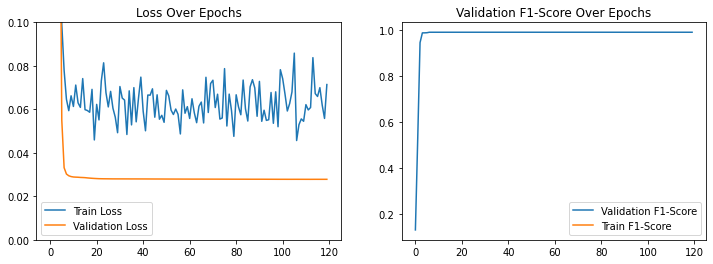

In [11]:
# History plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))

# Plotting Loss
plt.subplot(1, 2, 1)
plt.plot(history.history["loss"], label="Train Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.ylim(0, 0.1)
plt.legend()
plt.title("Loss Over Epochs")

# Plotting F1-Score
plt.subplot(1, 2, 2)
plt.plot(history.history.get("val_f1", []), label="Validation F1-Score")
plt.plot(history.history.get("f1", []), label="Train F1-Score")
plt.legend()
plt.title("Validation F1-Score Over Epochs")

plt.show()

In [12]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 224, 224, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 224, 224, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 112, 112, 64) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [15]:
def get_output(model, preproc, image_path, output_path, road_class=0):
    origin_img = imread(image_path)
    data = {"image": origin_img}
    processed = preproc(**data)
    
    # 모델 예측
    output = model(np.expand_dims(processed["image"] / 255, axis=0))
    output = output[0].numpy()  # 모델의 첫 번째 예측 결과 가져오기

    # 다중 클래스 예측에서 도로 클래스 (예: road_class=0) 마스크 추출
    output = (np.argmax(output, axis=-1) == road_class).astype(np.uint8) * 255

    # 시각화를 위한 이미지 변환
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.5)
    output.show()
    
    return output

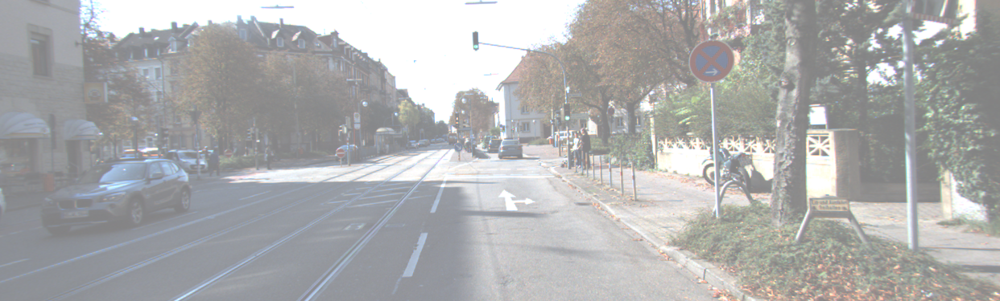

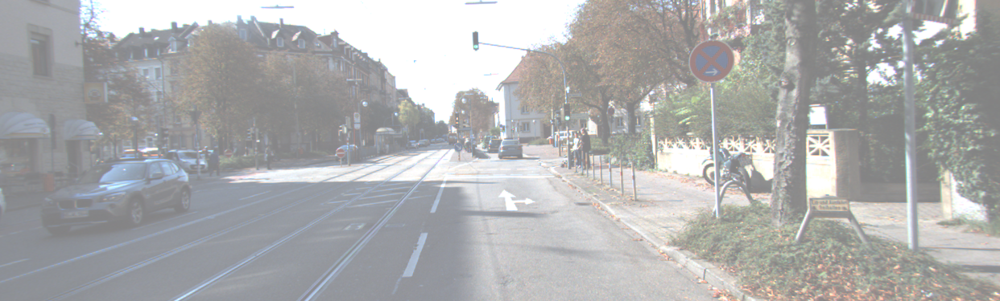

In [16]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png'
 )

In [17]:
def calculate_iou_score(target, prediction):
    # 교차 영역 (Intersection): target과 prediction이 모두 True인 부분만 True로 남깁니다.
    intersection = np.logical_and(target, prediction).sum()
    
    # 합집합 영역 (Union): target이나 prediction 중 하나라도 True인 부분을 계산합니다.
    union = np.logical_or(target, prediction).sum()
    
    # IoU 계산
    iou_score = float(intersection) / float(union) if union != 0 else 0.0
    
    print('IoU : %f' % iou_score)
    return iou_score

In [18]:
def get_output(model, preproc, image_path, output_path, label_path=None, road_class=0):
    origin_img = imread(image_path)
    data = {"image": origin_img}
    processed = preproc(**data)

    # 모델 예측
    output = model(np.expand_dims(processed["image"] / 255, axis=0))
    output = output[0].numpy()  # 모델의 첫 번째 예측 결과 가져오기

    # 다중 클래스 예측에서 도로 클래스 마스크 추출
    prediction = (np.argmax(output, axis=-1) == road_class).astype(np.uint8) * 255  # 도로로 판단한 영역 (0과 255로 표현)

    # 시각화를 위한 이미지 변환
    output_img = Image.fromarray(prediction)
    background = Image.fromarray(origin_img).convert('RGBA')
    output_img = output_img.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    blended_output = Image.blend(background, output_img, alpha=0.5)
    blended_output.show()  # 도로로 판단한 영역을 시각화

    # 실제 라벨과 비교
    target = None
    if label_path:
        label_img = imread(label_path)
        label_data = {"image": label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]

        # 라벨에서 도로 클래스 (예: 7번 클래스)를 추출
        target = (label_processed == 7).astype(np.uint8) * 255  # 라벨에서 도로로 기재된 영역

    return blended_output, prediction, target


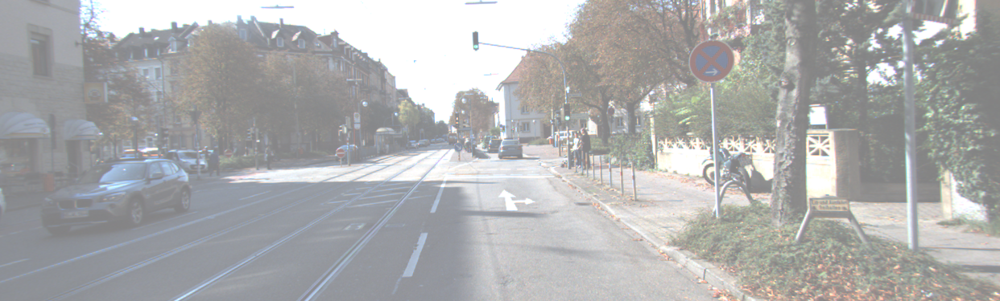

IoU : 0.253448


0.25344786352040816

In [19]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다. 
output, prediction, target = get_output(
     model, 
     test_preproc,
     image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
     label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

# 회고

* ### 오늘 여러가지 시도를 해봤지만 결과가 꽝이였다.
* ### augmentation을 다른 방식을 시도해봤고, 멀티 클래스 segmentation을 진행해봤지만, 학습의 문제인지 어디의 문제인지는 모르겠으나 결과가 안좋게 나왔다.
* ### 일단 학습의 경우에는 metric 설정이나, LR 변경 혹은 모델에 규제를 통해 조기학습종료를 막아야할 것 같다.
* ### 살짝 아쉽지만 뭔가 더 해본게 뿌듯하긴 하다